<a href="https://colab.research.google.com/github/ic666/test/blob/main/mobile_price.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 數值方法期末專題
### 這價格是怎麼訂的?—應用機器學習分析手機定價
### 執行學生： 陳彥安


### Colab安裝pandas-profiling,catboost,rfg



In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


In [ ]:
pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install rgf_python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### import fundamental library, dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mp
import matplotlib.pyplot as plt
%matplotlib inline
from pandas_profiling import ProfileReport
import seaborn as sns

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/mobile_price/train.csv")
train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


### features

*   id: 商品ID
*   battery_power: 電池容量 單位mAh
*   blue: 有無藍芽功能
*   clock_speed: 手機處理器速度 單位ghz
*   dual_sim: 有無雙sim卡
*   fc: 前(副)鏡頭像素 單位Megapixels
*   four_g: 有無支援4G
*   int_memory: 內部實際容量 單位GB
*   m_dep: 手機深度 單位cm
*   mobile_wt: 手機負重 單位g
*   n_cores: 核心數量
*   pc: 主鏡頭像素 單位Megapixels
*   px_height: 解析度高
*   px_width: 解析度寬
*   ram: RAM 單位Megabytes
*   sc_h: 螢幕長 單位cm
*   sc_w:Screen 螢幕寬 單位cm
*   talk_time: 電池續航力
*   three_g: 有無支援3G
*   touch_screen: 有無觸控螢幕
*   wifi: 能否接收WIFI


train.info(), train.profile_report():細看特徵分布與屬性，可以看出資料為全數值,無空值，數值間關係等等

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
profile = train.profile_report()
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 再細看各分組之corr()

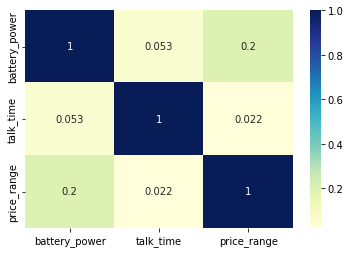

In [ ]:
#電池組 0,16

battery = train.iloc[:,[0,16,20]]
plt.figure(figsize=(6,4)) 
sns.heatmap(battery.corr(),annot=True,cmap="YlGnBu")
plt.show()

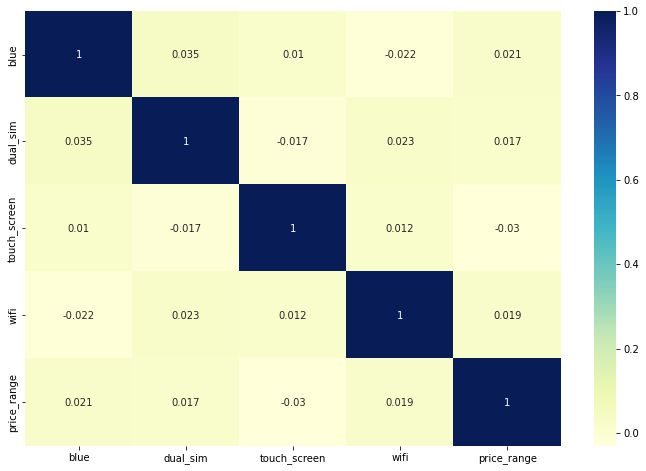

In [ ]:
#功能組 1,3,18,19

function = train.iloc[:,[1,3,18,19,20]]
plt.figure(figsize=(12,8)) 
sns.heatmap(function.corr(),annot=True,cmap="YlGnBu")
plt.show()

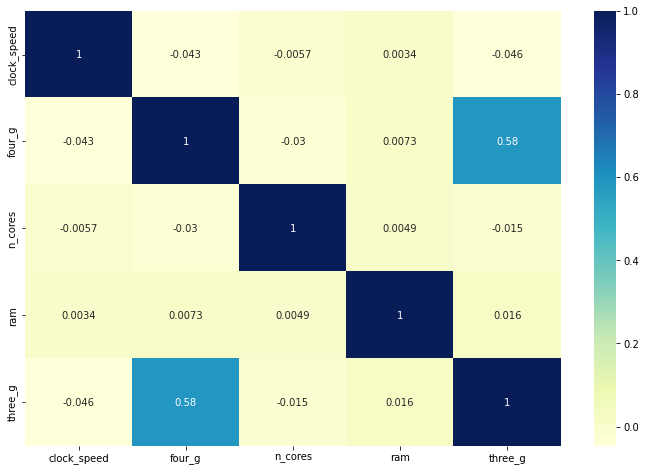

In [ ]:
#性能組 2.5.9.13.17

performance = train.iloc[:,[2,5,9,13,17]]
plt.figure(figsize=(12,8)) 
sns.heatmap(performance.corr(),annot=True,cmap="YlGnBu")
plt.show()

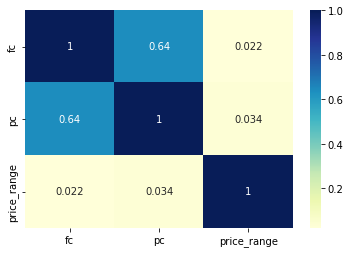

In [ ]:
#相機組 4,10

camara = train.iloc[:,[4,10,20]]
plt.figure(figsize=(6,4)) 
sns.heatmap(camara.corr(),annot=True,cmap="YlGnBu")
plt.show()

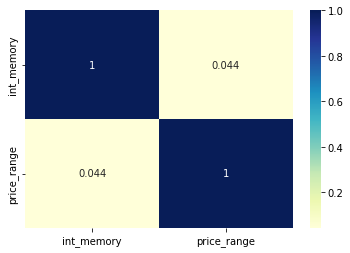

In [ ]:
#內存組 6

instore = train.iloc[:,[6,20]]
plt.figure(figsize=(6,4)) 
sns.heatmap(instore.corr(),annot=True,cmap="YlGnBu")
plt.show()

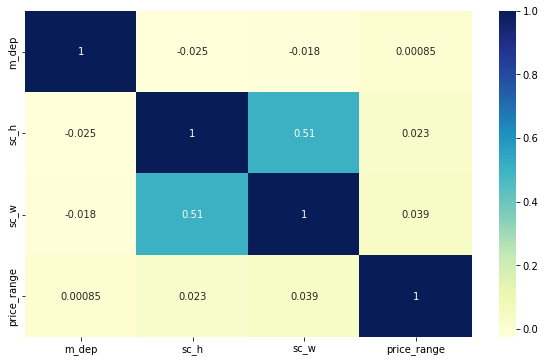

In [ ]:
#外觀組 7,14,15

appearance = train.iloc[:,[7,14,15,20]]
plt.figure(figsize=(10,6)) 
sns.heatmap(appearance.corr(),annot=True,cmap="YlGnBu")
plt.show()

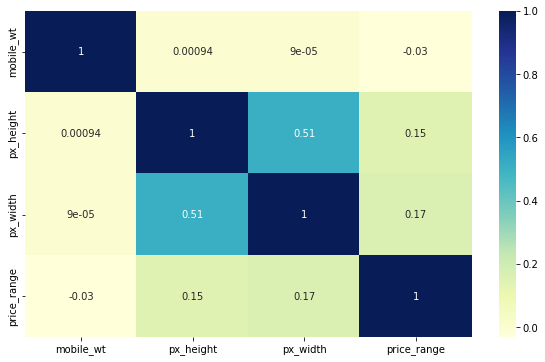

In [ ]:
#顯示組 8,11,12

screen = train.iloc[:,[8,11,12,20]]
plt.figure(figsize=(10,6)) 
sns.heatmap(screen.corr(),annot=True,cmap="YlGnBu")
plt.show()

### 取得訓練集資料，先訓練全部特徵，再看其他高度相關特徵

In [ ]:
x = train.drop('price_range',axis=1)
y = train['price_range']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y)

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn import decomposition
from sklearn.decomposition import PCA

### DecisionTree
最常用的分類器之一，當作基本對照組

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()),
                ('dct',
                 DecisionTreeClassifier(max_depth=8, min_samples_leaf=8,
                                        min_samples_split=9))])
Training Accuracy of DecisionTree Model is  0.918
Test Accuracy of DecisionTree Model is  0.842

Confusion Matrix:



Text(33.0, 0.5, 'Perdict')

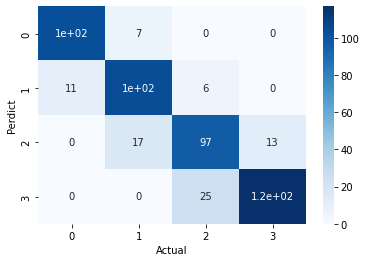

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dct_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) ,('dct', DecisionTreeClassifier())])
dct_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough'],
              'dct__max_depth': range(2,10,1),'dct__min_samples_split' : range(2, 10, 1),
              'dct__min_samples_leaf' : range(2, 10, 1)}
grid_search = GridSearchCV(dct_pipe, dct_grid_params, cv = 5)
grid_search.fit(x_train, y_train)
dct_best = grid_search.best_estimator_
dct_best.fit(x_train,y_train)
dct_train_acc = accuracy_score(y_train, dct_best.predict(x_train))
dct_test_acc = accuracy_score(y_test, dct_best.predict(x_test))
print("grid_search.best_estimator is ",dct_best)
print("Training Accuracy of DecisionTree Model is ",dct_train_acc)
print("Test Accuracy of DecisionTree Model is ",dct_test_acc)
print("\nConfusion Matrix:\n")
plot = sns.heatmap(confusion_matrix(y_test, dct_best.predict(x_test)), annot=True, cmap="Blues")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### SVC
只在scaler部分做調整，其他參數grid search後沒有比較好的成果

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()), ('svc', SVC())])
Training Accuracy of SVC is  0.9613333333333334
Test Accuracy of SVC is  0.95

Confusion Matrix:
 [[109   1   0   0]
 [  2 114   5   0]
 [  0   6 116   5]
 [  0   0   6 136]]


Text(17.200000000000003, 0.5, 'Perdict')

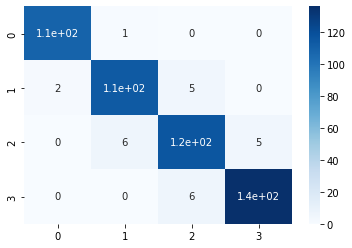

In [ ]:
from sklearn.svm import SVC

svc_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()), ('svc', SVC())])
svc_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough']}
grid_search = GridSearchCV(svc_pipe, svc_grid_params, cv = 5)
grid_search.fit(x_train, y_train)
svc_best = grid_search.best_estimator_
svc_best.fit(x_train,y_train)

svc_train_acc = accuracy_score(y_train, svc_best.predict(x_train))
svc_test_acc = accuracy_score(y_test, svc_best.predict(x_test))
print("grid_search.best_estimator is ",svc_best)
print("Training Accuracy of SVC is ",svc_train_acc)
print("Test Accuracy of SVC is ",svc_test_acc)
print("\nConfusion Matrix:\n",confusion_matrix(y_test, svc_best.predict(x_test)))
sns.heatmap(confusion_matrix(y_test, svc_best.predict(x_test)), annot=True, cmap="Blues")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### AdaBoost

grid_search.best_estimator is  Pipeline(steps=[('scaler', MinMaxScaler()), ('pca', PCA()),
                ('ada', AdaBoostClassifier(learning_rate=1, n_estimators=200))])
Training Accuracy of AdaBoostClassifier is  0.7766666666666666
Test Accuracy of AdaBoostClassifier is  0.756

Confusion Matrix:
 [[ 78  32   0   0]
 [  3 100  18   0]
 [  0  11 114   2]
 [  0   0  56  86]]


Text(17.200000000000003, 0.5, 'Perdict')

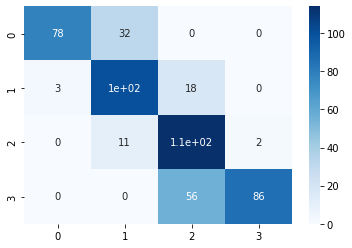

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

ada_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()), ('ada', AdaBoostClassifier())])
ada_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough'],
                   'ada__n_estimators' : [90,120,150,180,200],
                    'ada__learning_rate' : [0.01,0.1,1,5,10],
}

grid_search = GridSearchCV(ada_pipe, ada_grid_params, cv = 5)
grid_search.fit(x_train, y_train)
grid_search.best_params_
ada_best = grid_search.best_estimator_
ada_best.fit(x_train, y_train)

ada_train_acc = accuracy_score(y_train, ada_best.predict(x_train))
ada_test_acc = accuracy_score(y_test, ada_best.predict(x_test))
print("grid_search.best_estimator is ",ada_best)
print("Training Accuracy of AdaBoostClassifier is ",ada_train_acc)
print("Test Accuracy of AdaBoostClassifier is ",ada_test_acc)
print("\nConfusion Matrix:\n",confusion_matrix(y_test, ada_best.predict(x_test)))
sns.heatmap(confusion_matrix(y_test, ada_best.predict(x_test)), annot=True, cmap="Blues")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### Gradient Boosting

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()),
                ('gbc', GradientBoostingClassifier())])
Training Accuracy of GradientBoostingClassifier is  1.0
Test Accuracy of GradientBoostingClassifier is  0.916

Confusion Matrix:
 [[109   1   0   0]
 [  7 107   7   0]
 [  0   7 111   9]
 [  0   0  11 131]]


Text(17.200000000000003, 0.5, 'Perdict')

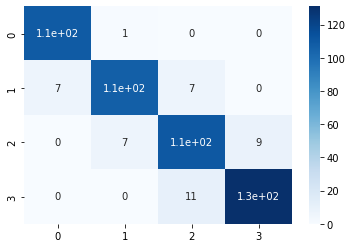

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gbc_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('gbc', GradientBoostingClassifier())])
gbc_grid_params = {'scaler': [StandardScaler(), 'passthrough']}

grid_search = GridSearchCV(gbc_pipe, gbc_grid_params, cv = 5)
grid_search.fit(x_train, y_train)
grid_search.best_params_
gbc_best = grid_search.best_estimator_
gbc_best.fit(x_train, y_train)

gbc_train_acc = accuracy_score(y_train,gbc_best.predict(x_train))
gbc_test_acc = accuracy_score(y_test, gbc_best.predict(x_test))
print("grid_search.best_estimator is ",gbc_best)
print("Training Accuracy of GradientBoostingClassifier is ",gbc_train_acc)
print("Test Accuracy of GradientBoostingClassifier is ",gbc_test_acc)
print("\nConfusion Matrix:\n",confusion_matrix(y_test,gbc_best.predict(x_test) ))
sns.heatmap(confusion_matrix(y_test, gbc_best.predict(x_test)), annot=True, cmap="Blues")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### XgBoost

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()),
                ('xgb', XGBClassifier(objective='multi:softprob'))])
Training Accuracy of XGBClassifier is  0.9873333333333333
Test Accuracy of XGBClassifier is  0.906

Confusion Matrix:
 [[109   1   0   0]
 [  7 106   8   0]
 [  0  11 108   8]
 [  0   0  12 130]]


Text(17.200000000000003, 0.5, 'Perdict')

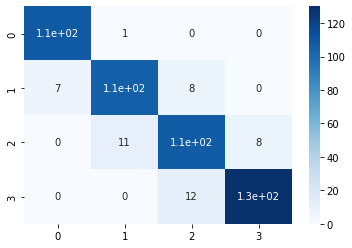

In [ ]:
from xgboost import XGBClassifier

xgb_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('xgb', XGBClassifier())])
xgb_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough']}

grid_search = GridSearchCV(xgb_pipe, xgb_grid_params, cv = 5)
grid_search.fit(x_train, y_train)
grid_search.best_params_
xgb_best = grid_search.best_estimator_
xgb_best.fit(x_train, y_train)

xgb_train_acc = accuracy_score(y_train,xgb_best.predict(x_train))
xgb_test_acc = accuracy_score(y_test, xgb_best.predict(x_test))
print("grid_search.best_estimator is ",xgb_best)
print("Training Accuracy of XGBClassifier is ",xgb_train_acc)
print("Test Accuracy of XGBClassifier is ",xgb_test_acc)
print("\nConfusion Matrix:\n",confusion_matrix(y_test,xgb_best.predict(x_test) ))
sns.heatmap(confusion_matrix(y_test, xgb_best.predict(x_test)), annot=True, cmap="Blues")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### CatBoost

In [ ]:
from catboost import CatBoostClassifier

串流輸出內容已截斷至最後 5000 行。
15:	learn: 0.6193510	total: 349ms	remaining: 21.5s
16:	learn: 0.5997904	total: 366ms	remaining: 21.2s
17:	learn: 0.5838673	total: 384ms	remaining: 20.9s
18:	learn: 0.5700715	total: 401ms	remaining: 20.7s
19:	learn: 0.5524671	total: 418ms	remaining: 20.5s
20:	learn: 0.5359430	total: 435ms	remaining: 20.3s
21:	learn: 0.5252504	total: 452ms	remaining: 20.1s
22:	learn: 0.5073871	total: 470ms	remaining: 20s
23:	learn: 0.4918716	total: 491ms	remaining: 20s
24:	learn: 0.4796147	total: 508ms	remaining: 19.8s
25:	learn: 0.4666568	total: 535ms	remaining: 20s
26:	learn: 0.4547335	total: 556ms	remaining: 20s
27:	learn: 0.4424995	total: 574ms	remaining: 19.9s
28:	learn: 0.4342894	total: 591ms	remaining: 19.8s
29:	learn: 0.4252337	total: 608ms	remaining: 19.6s
30:	learn: 0.4192303	total: 629ms	remaining: 19.7s
31:	learn: 0.4086858	total: 653ms	remaining: 19.8s
32:	learn: 0.4007777	total: 671ms	remaining: 19.7s
33:	learn: 0.3965185	total: 689ms	remaining: 19.6s
34:	learn: 0.38601

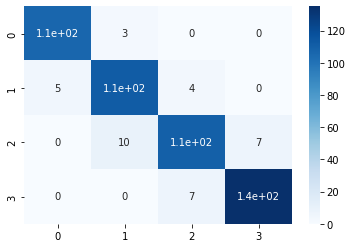

In [ ]:
cbc_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()), ('cbc', CatBoostClassifier())])
cbc_grid_params = {'scaler': [StandardScaler(), 'passthrough'],'cbc__iterations': [100,500,1000]}
grid_search = GridSearchCV(cbc_pipe,cbc_grid_params,  cv = 5)
grid_search.fit(x_train, y_train)
cbc_best = grid_search.best_estimator_
cbc_best.fit(x_train,y_train)
cbc_train_acc = accuracy_score(y_train, cbc_best.predict(x_train))
cbc_test_acc = accuracy_score(y_test, cbc_best.predict(x_test))
print("grid_search.best_estimator is ",cbc_best)
print("Training Accuracy of CatBoost is ",cbc_train_acc)
print("Test Accuracy of CatBoost is ",cbc_test_acc)
print("\nConfusion Matrix:\n",confusion_matrix(y_test, cbc_best.predict(x_test)))
sns.heatmap(confusion_matrix(y_test, cbc_best.predict(x_test)), annot=True, cmap="Blues")

### Regularized Greedy Forest(RGF)

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()),
                ('rgf', RGFClassifier())])
Training Accuracy of RGFClassifier is  0.9913333333333333
Test Accuracy of RGFClassifier is  0.908

Confusion Matrix:
 [[109   1   0   0]
 [  8 104   9   0]
 [  0   8 110   9]
 [  0   0  11 131]]


Text(17.200000000000003, 0.5, 'Perdict')

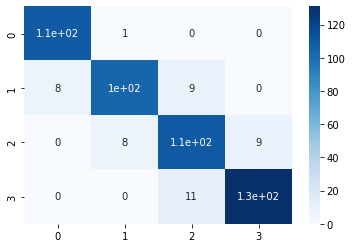

In [ ]:
from rgf.sklearn import RGFClassifier

rgf_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('rgf', RGFClassifier())])
rgf_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough']}

grid_search = GridSearchCV(rgf_pipe, rgf_grid_params, cv = 5)
grid_search.fit(x_train, y_train)
grid_search.best_params_
rgf_best = grid_search.best_estimator_
rgf_best.fit(x_train, y_train)

rgf_train_acc = accuracy_score(y_train,rgf_best.predict(x_train))
rgf_test_acc = accuracy_score(y_test, rgf_best.predict(x_test))
print("grid_search.best_estimator is ",rgf_best)
print("Training Accuracy of RGFClassifier is ",rgf_train_acc)
print("Test Accuracy of RGFClassifier is ",rgf_test_acc)
print("\nConfusion Matrix:\n",confusion_matrix(y_test,rgf_best.predict(x_test) ))
sns.heatmap(confusion_matrix(y_test, rgf_best.predict(x_test)), annot=True, cmap="Blues")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### 將高相關度(>0.1)or各分組之最高項之feature帶入分數高的演算法訓練，觀察成效

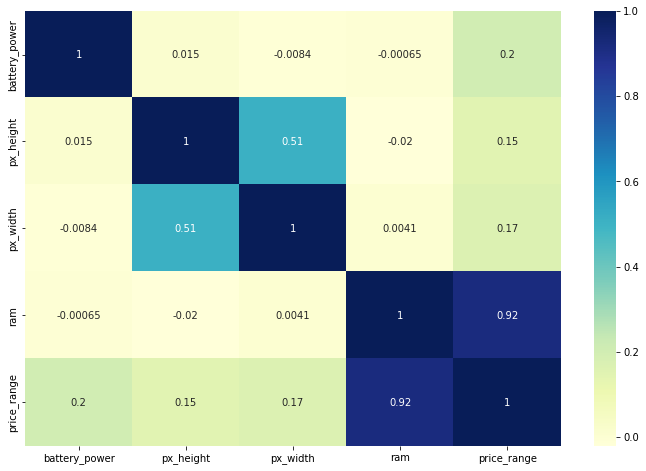

In [ ]:
high_corr = train.iloc[:,[0,11,12,13,20]]
plt.figure(figsize=(12,8)) 
sns.heatmap(high_corr.corr(),annot=True,cmap="YlGnBu")
plt.show()

In [ ]:
x_h = high_corr.drop('price_range',axis=1)
y_h = high_corr['price_range']

x_train_h, x_test_h, y_train_h, y_test_h = train_test_split(x_h, y_h)

### SVC ,GradientBoosting ,CatBoost ,RGF 帶入

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()), ('svc', SVC())])
Training Accuracy of SVC is  0.9653333333333334
Test Accuracy of SVC is  0.94

Confusion Matrix:
 [[115   4   0   0]
 [  4 118   6   0]
 [  0   3 112   4]
 [  0   0   9 125]]


Text(17.200000000000003, 0.5, 'Perdict')

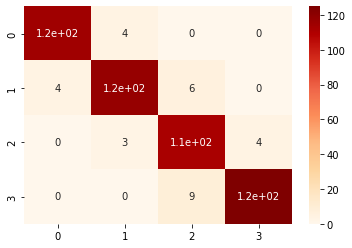

In [ ]:
pca = PCA()
svc_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('svc', SVC())])
svc_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough']}
grid_search = GridSearchCV(svc_pipe, svc_grid_params, cv = 5)
grid_search.fit(x_train_h, y_train_h)
svc_best = grid_search.best_estimator_
svc_best.fit(x_train_h,y_train_h)

svc_train_acc_h = accuracy_score(y_train_h, svc_best.predict(x_train_h))
svc_test_acc_h = accuracy_score(y_test_h, svc_best.predict(x_test_h))
print("grid_search.best_estimator is ",svc_best)
print("Training Accuracy of SVC is ",svc_train_acc_h)
print("Test Accuracy of SVC is ",svc_test_acc_h)
print("\nConfusion Matrix:\n",confusion_matrix(y_test_h, svc_best.predict(x_test_h)))
sns.heatmap(confusion_matrix(y_test_h, svc_best.predict(x_test_h)), annot=True, cmap="OrRd")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()),
                ('gbc', GradientBoostingClassifier())])
Training Accuracy of GradientBoostingClassifier is  0.9986666666666667
Test Accuracy of GradientBoostingClassifier is  0.892

Confusion Matrix:
 [[111   8   0   0]
 [  4 117   7   0]
 [  0   5 108   6]
 [  0   0  24 110]]


Text(17.200000000000003, 0.5, 'Perdict')

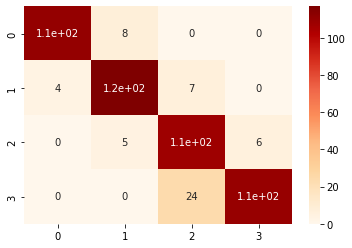

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gbc_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('gbc', GradientBoostingClassifier())])
gbc_grid_params = {'scaler': [StandardScaler(), 'passthrough']}

grid_search = GridSearchCV(gbc_pipe, gbc_grid_params, cv = 5)
grid_search.fit(x_train_h, y_train_h)
grid_search.best_params_
gbc_best = grid_search.best_estimator_
gbc_best.fit(x_train_h, y_train_h)

gbc_train_acc_h = accuracy_score(y_train_h,gbc_best.predict(x_train_h))
gbc_test_acc_h = accuracy_score(y_test_h, gbc_best.predict(x_test_h))
print("grid_search.best_estimator is ",gbc_best)
print("Training Accuracy of GradientBoostingClassifier is ",gbc_train_acc_h)
print("Test Accuracy of GradientBoostingClassifier is ",gbc_test_acc_h)
print("\nConfusion Matrix:\n",confusion_matrix(y_test_h,gbc_best.predict(x_test_h) ))
sns.heatmap(confusion_matrix(y_test_h, gbc_best.predict(x_test_h)), annot=True, cmap="OrRd")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

串流輸出內容已截斷至最後 5000 行。
16:	learn: 0.5355320	total: 74ms	remaining: 4.28s
17:	learn: 0.5170355	total: 83.1ms	remaining: 4.53s
18:	learn: 0.4993896	total: 91.8ms	remaining: 4.74s
19:	learn: 0.4810363	total: 95.7ms	remaining: 4.69s
20:	learn: 0.4645464	total: 99.7ms	remaining: 4.65s
21:	learn: 0.4490921	total: 104ms	remaining: 4.61s
22:	learn: 0.4343598	total: 107ms	remaining: 4.57s
23:	learn: 0.4213692	total: 111ms	remaining: 4.53s
24:	learn: 0.4098265	total: 115ms	remaining: 4.49s
25:	learn: 0.4001057	total: 119ms	remaining: 4.46s
26:	learn: 0.3892318	total: 123ms	remaining: 4.43s
27:	learn: 0.3777042	total: 129ms	remaining: 4.49s
28:	learn: 0.3689946	total: 133ms	remaining: 4.46s
29:	learn: 0.3595017	total: 137ms	remaining: 4.43s
30:	learn: 0.3520366	total: 146ms	remaining: 4.56s
31:	learn: 0.3428195	total: 158ms	remaining: 4.79s
32:	learn: 0.3372915	total: 164ms	remaining: 4.8s
33:	learn: 0.3302896	total: 168ms	remaining: 4.77s
34:	learn: 0.3238944	total: 171ms	remaining: 4.73s
35:	lear

Text(17.200000000000003, 0.5, 'Perdict')

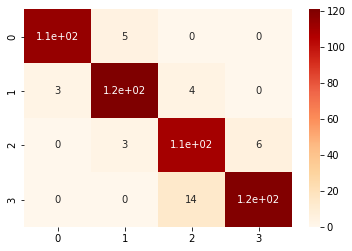

In [ ]:
from catboost import CatBoostClassifier

cb_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('cb', CatBoostClassifier())])
cb_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough'],'cb__iterations': [100,500,1000]}

grid_search = GridSearchCV(cb_pipe, cb_grid_params, cv = 5)
grid_search.fit(x_train_h, y_train_h)
grid_search.best_params_
cb_best = grid_search.best_estimator_
cb_best.fit(x_train_h, y_train_h)

cb_train_acc_h = accuracy_score(y_train_h,cb_best.predict(x_train_h))
cb_test_acc_h = accuracy_score(y_test_h, cb_best.predict(x_test_h))
print("grid_search.best_estimator is ",cb_best)
print("Training Accuracy of XGBClassifier is ",cb_train_acc_h)
print("Test Accuracy of XGBClassifier is ",cb_test_acc_h)
print("\nConfusion Matrix:\n",confusion_matrix(y_test_h,cb_best.predict(x_test_h) ))
sns.heatmap(confusion_matrix(y_test_h, cb_best.predict(x_test_h)), annot=True, cmap="OrRd")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

Training Accuracy of LGBMClassifier is  0.9833333333333333
Test Accuracy of LGBMClassifier is  0.898
grid_search.best_estimator is  Pipeline(steps=[('scaler', 'passthrough'), ('pca', PCA()),
                ('rgf', RGFClassifier())])

Confusion Matrix:
 [[114   5   0   0]
 [  6 111  11   0]
 [  0   7 107   5]
 [  0   0  17 117]]


Text(17.200000000000003, 0.5, 'Perdict')

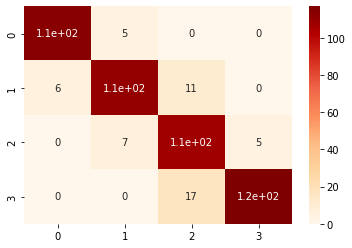

In [ ]:
from rgf.sklearn import RGFClassifier

rgf_pipe = Pipeline([('scaler', StandardScaler()),("pca", PCA()) , ('rgf', RGFClassifier())])
rgf_grid_params = {'scaler': [MinMaxScaler(), StandardScaler(), 'passthrough']}

grid_search = GridSearchCV(rgf_pipe, rgf_grid_params, cv = 5)
grid_search.fit(x_train_h, y_train_h)
grid_search.best_params_
rgf_best = grid_search.best_estimator_
rgf_best.fit(x_train_h, y_train_h)

rgf_train_acc_h = accuracy_score(y_train_h,rgf_best.predict(x_train_h))
rgf_test_acc_h = accuracy_score(y_test_h, rgf_best.predict(x_test_h))
print("Training Accuracy of LGBMClassifier is ",rgf_train_acc_h)
print("Test Accuracy of LGBMClassifier is ",rgf_test_acc_h)
print("grid_search.best_estimator is ",rgf_best)
print("\nConfusion Matrix:\n",confusion_matrix(y_test_h,rgf_best.predict(x_test_h) ))
sns.heatmap(confusion_matrix(y_test_h, rgf_best.predict(x_test_h)), annot=True, cmap="OrRd")
plot.set_xlabel("Actual")
plot.set_ylabel("Perdict")

### 觀察成果:ALL features and High corr features

In [ ]:
model_all = pd.DataFrame({
    'Model': ['SVC', 'DecisionTree','AdaBoost','GradientBoosting', 'XgBoost',"CatBoost", 'RGF'],
    'Score': [svc_test_acc, dct_test_acc, ada_test_acc, gbc_test_acc, xgb_test_acc,cbc_test_acc,rgf_test_acc]
})

model_all.sort_values(by = 'Score', ascending = False)

,Model,Score
0,SVC,0.950
5,CatBoost,0.928
3,GradientBoosting,0.916
6,RGF,0.908
4,XgBoost,0.906
1,DecisionTree,0.842
2,AdaBoost,0.756


In [ ]:
model_h = pd.DataFrame({
    'Model': ['SVC','GradientBoosting','CatBoost', 'RGF'],
    'Score': [svc_test_acc_h,gbc_test_acc_h,cb_test_acc_h,rgf_test_acc_h]
})

model_h.sort_values(by = 'Score', ascending = False)

,Model,Score
0,SVC,0.940
2,CatBoost,0.930
3,RGF,0.898
1,GradientBoosting,0.892


### 實作小結:選六個feature太少+訓練資料不足等因素導致這樣的成績，同時用比較先進的演算法訓練也不一定有好的成效
### 註:這裡的成果是調參訓練後留下最好之結果

# 參考文獻

*   [1] I. M. Nasser, Mohammed Al-Shawwa, "ANN for Predicting Mobile Phone Price Range", International Journal of Academic Information Systems Research (IJAISR)Vol. 3 Issue 2, February – 2019, Department of Information Technology Faculty of Engineering & Information Technology
*   [2]Groß, M. (2015), "Mobile shopping: a classification framework and literature review", International Journal of Retail & Distribution Management, Vol. 43 No. 3, pp. 221-241.


*  [3] Dongliang Huang; Hamidreza Zareipour; William D. Rosehart; Nima Amjady(2012)Data Mining for Electricity Price Classification and the Application to Demand-Side Management
*   [4] Mustafa Çetın; Yunus Koç (2021)Mobile Phone Price Class Prediction Using Different Classification Algorithms with Feature Selection and Parameter Optimization, 2021 5th International Symposium on Multidisciplinary Studies and Innovative Technologies (ISMSIT)


*   [5] K. S. Kalaivan , N. Priyadharshini , S. Nivedhashri , and R. Nandhini, Predicting the price range of mobile phones using machine learning techniques, AIP Conference Proceedings 2387, 140010 (2021)
*   [6] S. Selvin, R.Vinayakumar, E. Gopalakrishnan, V. K. Menon, and K.
Soman (2017). Stock price prediction using LSTM, RNN and CNNsliding window model. In 2017 International Conference on
Advances in Computing, Communications and Informatics (ICACCI)

*   [7] L. Zhenga, and H. Heb, "Share Price Prediction of Aerospace
Relevant Companies with Recurrent Neural Networks based on
PCA", AVIC General Huanan Aircraft Industry Co., Ltd., Aviation
Industry Zone, Sanzao Town, Jinwan District, Zhuhai City,
Guangdong Province, China, 519040 , School of Aerospace,
Transport and Manufacturing, Cranfield University, Cranfield, 26
August 2020 








